In [ ]:
from fastai.vision.all import *

In [ ]:
path = untar_data(URLs.CAMVID)
codes = np.loadtxt(path/'codes.txt', dtype=str)
dblock = DataBlock(blocks    = (ImageBlock, MaskBlock(codes)),
                   get_items = get_image_files,
                   splitter  = FileSplitter(path/'valid.txt'),
                   get_y     = lambda o: path/'labels'/f'{o.stem}_P{o.suffix}',
                   batch_tfms=[*aug_transforms(size=(256,384)), Normalize.from_stats(*imagenet_stats)])
dls = dblock.dataloaders(path/"images", bs=8, path=path)
dls.vocab = dls.vocab = codes

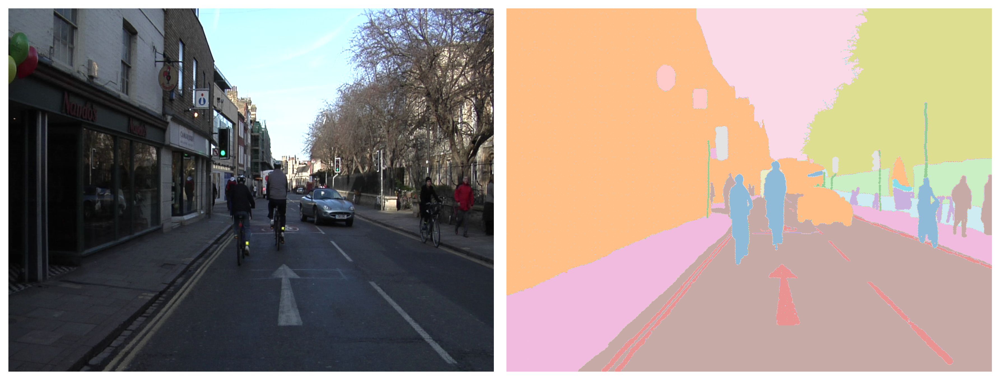

In [ ]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12,12), dpi=300)
dls.valid_ds[0][0].show(ax=ax1)
dls.valid_ds[0][1].show(ax=ax2)
fig.tight_layout()

In [ ]:
class ConvLayer(nn.Sequential):
    def __init__(self, in_channels, out_channels, ks=3):
        super().__init__(
            nn.Conv2d(in_channels, out_channels, kernel_size=ks, padding=ks//2, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True))

class ConvBlock(nn.Sequential):
    def __init__(self, in_channels, out_channels):
        super().__init__(
            ConvLayer(in_channels,out_channels),
            ConvLayer(out_channels,out_channels),
            MaxPool(2))
        
class UpConvBlock(Module):
    def __init__(self, in_channels1, in_channels2, out_channels):
        self.upscale = nn.ConvTranspose2d(in_channels1, in_channels1, kernel_size=2, stride=2)
        self.conv1 = ConvLayer(in_channels1 + in_channels2, out_channels)
        self.conv2 = ConvLayer(out_channels, out_channels)
        
    def forward(self, x1, x2):
        x_up = self.upscale(x1)
        x = torch.cat([x_up,x2], dim=1)
        return self.conv2(self.conv1(x))
    
class UNet(Module):
    def __init__(self, in_channels, out_channels):
        self.block1 = ConvBlock(in_channels, 64)
        self.block2 = ConvBlock(64, 128)
        self.block3 = ConvBlock(128, 256)
        self.block4 = ConvBlock(256, 512)
        self.block5 = ConvBlock(512, 1024)
        self.upblock5 = UpConvBlock(1024, 512, 512)
        self.upblock4 = UpConvBlock(512, 256, 256)
        self.upblock3 = UpConvBlock(256, 128, 128)
        self.upblock2 = UpConvBlock(128, 64, 64)
        self.upblock1 = UpConvBlock(64, in_channels, out_channels)
        
    def forward(self, o):         # Input size: bs x 3 x 128 x 128
        x1 = self.block1(o)       # bs x   64 x 64 x 64
        x2 = self.block2(x1)      # bs x  128 x 32 x 32
        x3 = self.block3(x2)      # bs x  256 x 16 x 16
        x4 = self.block4(x3)      # bs x  512 x  8 x  8
        x  = self.block5(x4)      # bs x 1024 x  4 x  4
        x  = self.upblock5(x, x4) # bs x  512 x  8 x  8
        x  = self.upblock4(x, x3) # bs x  256 x 16 x 16
        x  = self.upblock3(x, x2) # bs x  128 x 32 x 32
        x  = self.upblock2(x, x1) # bs x  64  x 64 x 64
        x  = self.upblock1(x, o)  # bs x   1 x 128 x 128
        return x                  # Output size: bs x 1 x 128 x 128

In [ ]:
name2id = {v:k for k,v in enumerate(codes)}
void_code = name2id['Void']

def acc_camvid(input, target):
    input = torch.cuda.FloatTensor(input)
    target = torch.cuda.LongTensor(target)
    target = target.squeeze(1)
    mask = target != void_code
    return (input.argmax(dim=1)[mask]==target[mask]).float().mean()

def loss(x, y):
    return nn.CrossEntropyLoss()(torch.cuda.FloatTensor(x),torch.cuda.LongTensor(y))

# Train Basic U-Net model

In [ ]:
model = UNet(3,len(dls.vocab)).cuda()
learn = Learner(dls, model, loss_func=loss, metrics=acc_camvid)

In [ ]:
learn.fit_one_cycle(12, 3e-3, wd=1e-2)

epoch,train_loss,valid_loss,acc_camvid,time
0,2.633308,1.795575,0.718901,00:36
1,2.233881,2.753656,0.562041,00:30
2,1.876356,2.235122,0.499427,00:29
3,1.575927,1.458728,0.760407,00:29
4,1.332695,1.003399,0.828559,00:29
5,1.171031,0.955460,0.825039,00:30
6,1.029192,0.799658,0.851143,00:29
7,0.936892,0.712538,0.866117,00:29
8,0.858093,0.701644,0.861475,00:29
9,0.804631,0.639706,0.870323,00:29


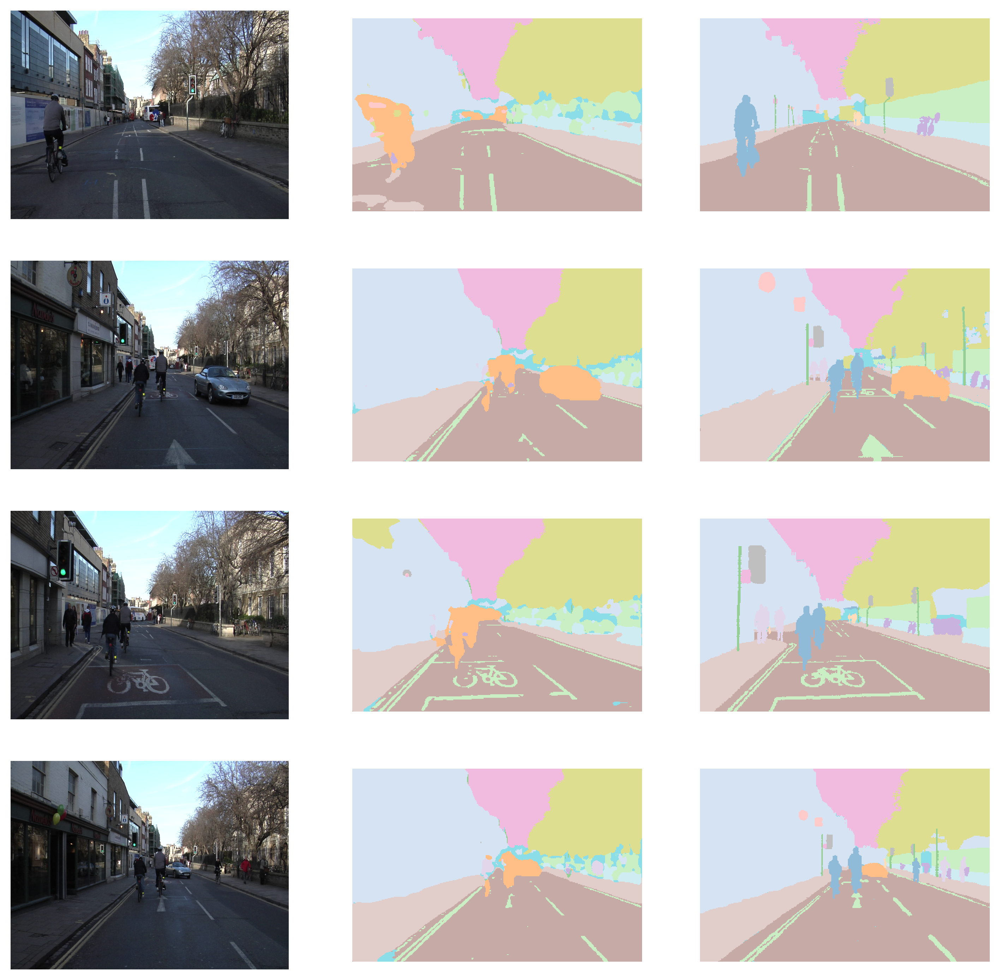

In [ ]:
preds, ys = learn.get_preds()
preds = TensorMask(preds.argmax(1))
preds.codes = codes
ys.codes = codes

fig, axes = plt.subplots(ncols=3, nrows=4, figsize=(12,12), dpi=300)
for i,r in enumerate(np.random.randint(len(preds), size=4)):
    dls.valid_ds[r][0].show(ax=axes[i][0])
    preds[r].show(ax=axes[i][1])
    ys[r].show(ax=axes[i][2])

# Train fastai U-Net with Resnet34 encoder

In [ ]:
learn = unet_learner(dls, resnet34, metrics=acc_camvid)
learn.fit_one_cycle(12, 3e-3, wd=1e-2)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


epoch,train_loss,valid_loss,acc_camvid,time
0,1.217093,0.839767,0.792500,00:40
1,0.882621,0.740662,0.829905,00:34
2,1.493423,1.328011,0.611505,00:35
3,1.195866,0.933374,0.749534,00:35
4,0.862245,0.669615,0.836446,00:35
5,0.685076,0.512628,0.860312,00:35
6,0.598593,0.504577,0.869399,00:34
7,0.545910,0.422567,0.885709,00:35
8,0.497071,0.416356,0.886235,00:35
9,0.465518,0.405741,0.884307,00:35


In [ ]:
learn.unfreeze()
learn.fit_one_cycle(12, slice(1e-5, 1e-3), wd=1e-2)

epoch,train_loss,valid_loss,acc_camvid,time
0,0.417770,0.391842,0.891528,00:36
1,0.436976,0.387292,0.888961,00:36
2,0.437125,0.386711,0.894064,00:36
3,0.427956,0.391180,0.889013,00:36
4,0.410363,0.368320,0.892485,00:36
5,0.393127,0.351074,0.897536,00:37
6,0.372381,0.323190,0.908674,00:36
7,0.348931,0.324245,0.909682,00:36
8,0.328114,0.331836,0.908063,00:37
9,0.316111,0.318069,0.911337,00:36


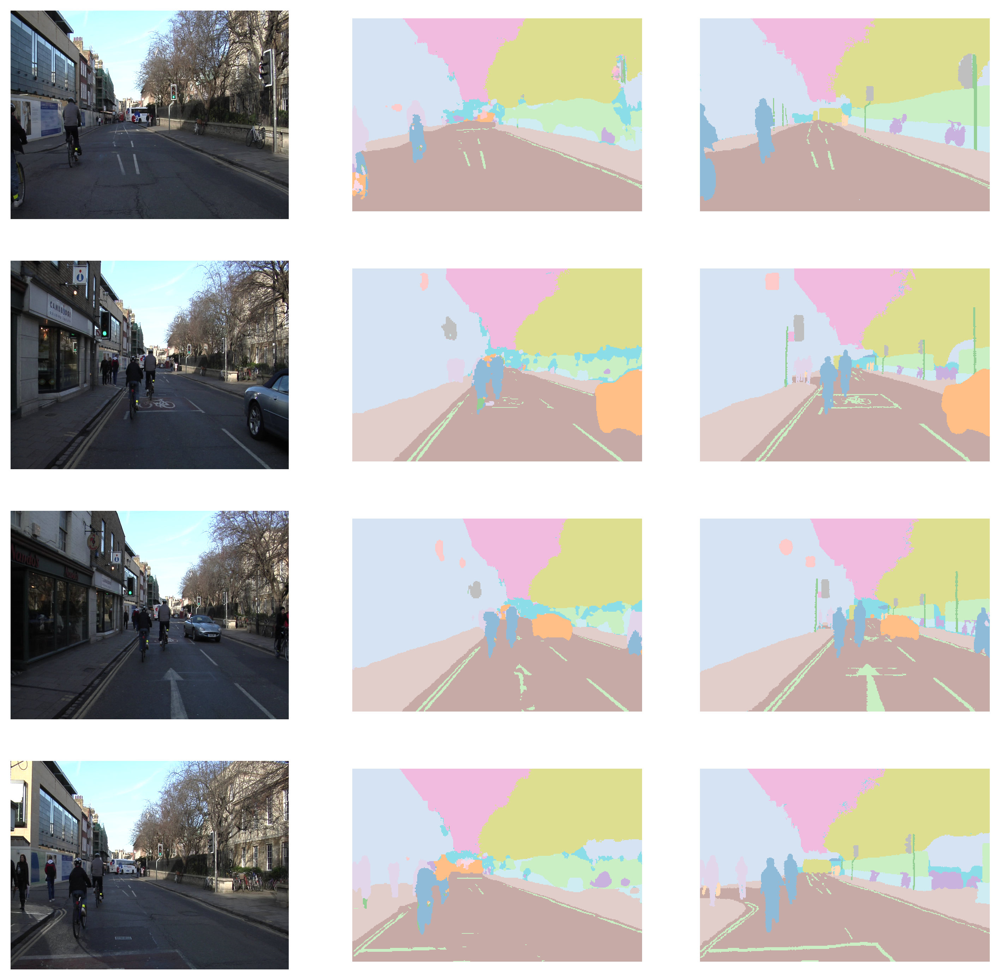

In [ ]:
preds, ys = learn.get_preds()
preds = TensorMask(preds.argmax(1))
preds.codes = codes
ys.codes = codes

fig, axes = plt.subplots(ncols=3, nrows=4, figsize=(12,12), dpi=300)
for i,r in enumerate(np.random.randint(len(preds), size=4)):
    dls.valid_ds[r][0].show(ax=axes[i][0])
    preds[r].show(ax=axes[i][1])
    ys[r].show(ax=axes[i][2])